In [28]:
import os
import torch
from torch import Tensor
from pathlib import Path
from typing import List, Optional, Sequence, Union, Any, Callable
from torchvision.datasets.folder import default_loader
from pytorch_lightning import LightningDataModule
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torchvision.datasets import CelebA
import zipfile
from torchvision.datasets.folder import default_loader
import pandas as pd
device = torch.device("cuda" if torch.cuda.is_available else "cpu") 
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from torchvision.utils import save_image, make_grid
import csv
from tqdm import tqdm
import torch.nn.functional as F

In [29]:
class MyCelebA(Dataset):

    def __init__(self, data_path: str, split: str, transform=None, subset_size=None):
        self.data_dir = Path(data_path) / "celeba/img_align_celeba/img_align_celeba"
        self.split = split
        self.transform = transform
        self.subset_size = subset_size
        attr_path = Path(data_path) / "celeba/list_attr_celeba.txt"
        split_path = Path(data_path) / "celeba/list_eval_partition.txt"
        self.attrs = pd.read_csv(attr_path, delim_whitespace=True, skiprows=1)
        self.split_info = pd.read_csv(split_path, delim_whitespace=True, header=None, names=["image_id", "split"])
        split_map = {"train": 0, "valid": 1, "test": 2}
        split_value = split_map[split]
        self.split_images = self.split_info[self.split_info["split"] == split_value]["image_id"].values
        
        if self.subset_size:
            self.split_images = self.split_images[:self.subset_size]

    def __len__(self):
        return len(self.split_images)

    def __getitem__(self, idx):
        image_id = self.split_images[idx]
        image_path = self.data_dir / image_id
        attributes = self.attrs.loc[image_id].values.astype(float)
        image = default_loader(image_path)
        if self.transform:
            image = self.transform(image)

        return image, attributes
class VAEDataset(LightningDataModule):

    def __init__(
        self,
        data_path: str,
        train_batch_size: int = 64,
        val_batch_size: int = 64,
        patch_size: tuple = (128, 128),
        num_workers: int = 4,
        pin_memory: bool = False,
        subset_size: int = 10000, 
    ):
        super().__init__()
        self.data_dir = data_path
        self.train_batch_size = train_batch_size
        self.val_batch_size = val_batch_size
        self.patch_size = patch_size
        self.num_workers = num_workers
        self.pin_memory = pin_memory
        self.subset_size = subset_size

    def setup(self, stage: str = None):
        transform = transforms.Compose([
            transforms.Resize(self.patch_size),
            transforms.CenterCrop(self.patch_size),
            transforms.ToTensor(),
        ])

        self.train_dataset = MyCelebA(
            self.data_dir, split="train", transform=transform, subset_size=self.subset_size
        )
        self.val_dataset = MyCelebA(
            self.data_dir, split="test", transform=transform, subset_size=self.subset_size
        )

    def train_dataloader(self) -> DataLoader:
        return DataLoader(
            self.train_dataset,
            batch_size=self.train_batch_size,
            num_workers=self.num_workers,
            shuffle=True,
            pin_memory=self.pin_memory,
        )

    def val_dataloader(self) -> DataLoader:
        return DataLoader(
            self.val_dataset,
            batch_size=self.val_batch_size,
            num_workers=self.num_workers,
            shuffle=False,
            pin_memory=self.pin_memory,
        )


In [30]:
data_module = VAEDataset(data_path="/kaggle/input/celeba", train_batch_size=128, val_batch_size=128)
data_module.setup()

train_loader = data_module.train_dataloader()
val_loader = data_module.val_dataloader()

for images, attributes in train_loader:
    print(images.shape, attributes.shape)
    break

/tmp/ipykernel_23/1659055083.py:15: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  self.attrs = pd.read_csv(attr_path, delim_whitespace=True, skiprows=1)
/tmp/ipykernel_23/1659055083.py:16: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  self.split_info = pd.read_csv(split_path, delim_whitespace=True, header=None, names=["image_id", "split"])
/tmp/ipykernel_23/1659055083.py:15: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  self.attrs = pd.read_csv(attr_path, delim_whitespace=True, skiprows=1)
/tmp/ipykernel_23/1659055083.py:16: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  self.split_info = pd.read_csv(s

torch.Size([128, 3, 128, 128]) torch.Size([128, 40])


In [31]:
IMAGE_SIZE = 128
celeb_transform1 = transforms.Compose([
    transforms.Resize(IMAGE_SIZE, antialias=True),
    transforms.CenterCrop(IMAGE_SIZE)])  


class BetaVAE(nn.Module):
    def __init__(self, beta, img_size, latent_dim):
        super(BetaVAE, self).__init__()
        self.img_size = img_size
        self.latent_dim = latent_dim
        self.beta = beta

        hidden_dims = [32, 64, 128, 256, 512]
        self.final_dim = hidden_dims[-1]
        in_channels = 3
        modules = []

        for h_dim in hidden_dims:
            modules.append(
                nn.Sequential(
                    nn.Conv2d(in_channels, out_channels=h_dim,
                              kernel_size=3, stride=2, padding=1),
                    nn.BatchNorm2d(h_dim),
                    nn.LeakyReLU())
            )
            in_channels = h_dim

        self.encoder = nn.Sequential(*modules)
        out = self.encoder(torch.rand(1, 3, self.img_size, self.img_size))
        self.size = out.shape[2]
        self.fc_mu = nn.Linear(hidden_dims[-1] * self.size * self.size, self.latent_dim)
        self.fc_var = nn.Linear(hidden_dims[-1] * self.size * self.size, self.latent_dim)

        # Build Decoder
        modules = []
        self.decoder_input = nn.Linear(self.latent_dim, hidden_dims[-1] * self.size * self.size)
        hidden_dims.reverse()

        for i in range(len(hidden_dims) - 1):
            modules.append(
                nn.Sequential(
                    nn.ConvTranspose2d(hidden_dims[i],
                                       hidden_dims[i + 1],
                                       kernel_size=3,
                                       stride=2,
                                       padding=1,
                                       output_padding=1),
                    nn.BatchNorm2d(hidden_dims[i + 1]),
                    nn.LeakyReLU())
            )

        self.decoder = nn.Sequential(*modules)

        self.final_layer = nn.Sequential(
            nn.ConvTranspose2d(hidden_dims[-1],
                               hidden_dims[-1],
                               kernel_size=3,
                               stride=2,
                               padding=1,
                               output_padding=1),
            nn.BatchNorm2d(hidden_dims[-1]),
            nn.LeakyReLU(),
            nn.Conv2d(hidden_dims[-1], out_channels=3,
                      kernel_size=3, padding=1),
            nn.Sigmoid())

    def encode(self, x):
        result = self.encoder(x)
        result = torch.flatten(result, start_dim=1)
        mu = self.fc_mu(result)
        log_var = self.fc_var(result)
        return mu, log_var

    def reparameterize(self, mu, log_var):
        std = torch.exp(0.5 * log_var)
        eps = torch.randn_like(std)
        return eps * std + mu

    def decode(self, z):
        result = self.decoder_input(z)
        result = result.view(-1, self.final_dim, self.size, self.size)
        result = self.decoder(result)
        result = self.final_layer(result)
        result = celeb_transform1(result)
        result = torch.nan_to_num(result)
        return result

    def forward(self, x):
        mu, log_var = self.encode(x)
        z = self.reparameterize(mu, log_var)
        return [self.decode(z), x, mu, log_var]

    def loss_function(self, output, input, mu, log_var) -> dict:
        recons_loss = F.mse_loss(output, input, reduction='sum') / input.size(0)
        kld_loss = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp()) / input.size(0)
        loss = recons_loss + self.beta * kld_loss
        return {
            'loss': loss, 
            'Reconstruction_Loss': recons_loss, 
            'KLD': self.beta * kld_loss
        }
        
    def sample(self, num_samples: int, current_device: int) -> Tensor:
        z = torch.randn(num_samples, self.latent_dim)
        z = z.to(current_device)
        samples = self.decode(z)
        return samples

    def generate(self, x: Tensor) -> Tensor:
        return self.forward(x)[0]

In [32]:
def training_step(model, optimizer):
    total_loss = 0.0
    total_recon_loss = 0.0
    total_kld_loss = 0.0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()

        results = model(inputs)
        train_loss = model.loss_function(*results)

        train_loss["loss"].backward()
        optimizer.step()

        total_loss += train_loss["loss"].item()
        total_recon_loss += train_loss["Reconstruction_Loss"].item()
        total_kld_loss += train_loss["KLD"].item()

    avg_loss = total_loss / len(train_loader)
    avg_recon_loss = total_recon_loss / len(train_loader)
    avg_kld_loss = total_kld_loss / len(train_loader)

    return avg_loss, avg_recon_loss, avg_kld_loss

def train(model, log_path, model_path, epochs):
    model.train()
    epoch_count = 0

    with open(log_path, 'w', newline='') as log_file:
        writer = csv.writer(log_file)
        writer.writerow(["epochs", "total_loss", "reconstruction_loss", "KLD Loss"])

        for epoch in tqdm(range(epochs), desc="VAE Epochs"):
            epoch_count += 1

            total_loss, reconstruction_loss, kld_loss = training_step(model, optimizer)
            writer.writerow([epoch + 1, total_loss, reconstruction_loss, kld_loss])

            print(f"Epoch {epoch_count}/{epochs}, Total Loss: {total_loss:.4f}, "
                  f"Reconstruction Loss: {reconstruction_loss:.4f}, KLD Loss: {kld_loss:.4f}")

    torch.save(model.state_dict(), model_path)
    print(f"Model saved to {model_path}.")

def count_parameters(model):
    return sum(param.numel() for param in model.parameters() if param.requires_grad)

def sample_images(model, test_loader, device):
    test_input, test_label = next(iter(test_loader))
    test_input = test_input.to(device)

    model.eval()
    with torch.no_grad():
        recons = model.generate(test_input)

    test_input = test_input.cpu().numpy()
    recons = recons.cpu().numpy()

    num_images = min(5, len(test_input))
    fig, axes = plt.subplots(2, num_images, figsize=(10, 4))

    for i in range(num_images):
        axes[0, i].imshow(test_input[i].transpose(1, 2, 0))
        axes[0, i].set_title("Original")
        axes[0, i].axis('off')

        axes[1, i].imshow(recons[i].transpose(1, 2, 0))
        axes[1, i].set_title("Reconstructed")
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()


In [33]:
model = BetaVAE(beta=1, img_size=128,latent_dim=32)
model.to(device)
print(f"Variation Autoencoder with parameters {count_parameters(model)}")
optimizer = torch.optim.AdamW(model.parameters(), lr=5e-4)

train(model, "vae_log.csv", "vae_model.pth", epochs=20)

Variation Autoencoder with parameters 3943587


VAE Epochs:   5%|▌         | 1/20 [00:08<02:40,  8.43s/it]

Epoch 1/20, Total Loss: 17.34422492980957, Reconstruction Loss: 16.31475257873535, KLD Loss: 1.0294711589813232


VAE Epochs:  10%|█         | 2/20 [00:16<02:33,  8.50s/it]

Epoch 2/20, Total Loss: 16.152935028076172, Reconstruction Loss: 15.154476165771484, KLD Loss: 0.998460054397583


VAE Epochs:  15%|█▌        | 3/20 [00:25<02:25,  8.57s/it]

Epoch 3/20, Total Loss: 10.91481876373291, Reconstruction Loss: 9.891880989074707, KLD Loss: 1.02293860912323


VAE Epochs:  20%|██        | 4/20 [00:34<02:20,  8.76s/it]

Epoch 4/20, Total Loss: 13.293381690979004, Reconstruction Loss: 12.15676498413086, KLD Loss: 1.1366163492202759


VAE Epochs:  25%|██▌       | 5/20 [00:43<02:09,  8.64s/it]

Epoch 5/20, Total Loss: 11.669088363647461, Reconstruction Loss: 10.678735733032227, KLD Loss: 0.9903525114059448


VAE Epochs:  30%|███       | 6/20 [00:51<02:00,  8.59s/it]

Epoch 6/20, Total Loss: 9.412450790405273, Reconstruction Loss: 8.382471084594727, KLD Loss: 1.0299803018569946


VAE Epochs:  35%|███▌      | 7/20 [01:00<01:50,  8.54s/it]

Epoch 7/20, Total Loss: 10.776904106140137, Reconstruction Loss: 9.70193862915039, KLD Loss: 1.0749661922454834


VAE Epochs:  40%|████      | 8/20 [01:08<01:42,  8.54s/it]

Epoch 8/20, Total Loss: 10.218053817749023, Reconstruction Loss: 9.245684623718262, KLD Loss: 0.9723690748214722


VAE Epochs:  45%|████▌     | 9/20 [01:16<01:33,  8.50s/it]

Epoch 9/20, Total Loss: 10.136689186096191, Reconstruction Loss: 9.057819366455078, KLD Loss: 1.0788700580596924


VAE Epochs:  50%|█████     | 10/20 [01:25<01:25,  8.54s/it]

Epoch 10/20, Total Loss: 10.852298736572266, Reconstruction Loss: 9.731987953186035, KLD Loss: 1.1203104257583618


VAE Epochs:  55%|█████▌    | 11/20 [01:34<01:17,  8.64s/it]

Epoch 11/20, Total Loss: 11.813271522521973, Reconstruction Loss: 10.790066719055176, KLD Loss: 1.0232046842575073


VAE Epochs:  60%|██████    | 12/20 [01:42<01:08,  8.56s/it]

Epoch 12/20, Total Loss: 10.17541790008545, Reconstruction Loss: 9.11935043334961, KLD Loss: 1.0560673475265503


VAE Epochs:  65%|██████▌   | 13/20 [01:51<00:59,  8.52s/it]

Epoch 13/20, Total Loss: 9.71358585357666, Reconstruction Loss: 8.733943939208984, KLD Loss: 0.9796422719955444


VAE Epochs:  70%|███████   | 14/20 [01:59<00:50,  8.47s/it]

Epoch 14/20, Total Loss: 9.129572868347168, Reconstruction Loss: 8.185118675231934, KLD Loss: 0.9444549679756165


VAE Epochs:  75%|███████▌  | 15/20 [02:08<00:42,  8.58s/it]

Epoch 15/20, Total Loss: 13.766214370727539, Reconstruction Loss: 12.609251022338867, KLD Loss: 1.156962513923645


VAE Epochs:  80%|████████  | 16/20 [02:16<00:34,  8.56s/it]

Epoch 16/20, Total Loss: 11.822007179260254, Reconstruction Loss: 10.737152099609375, KLD Loss: 1.0848551988601685


VAE Epochs:  85%|████████▌ | 17/20 [02:25<00:25,  8.57s/it]

Epoch 17/20, Total Loss: 9.313875198364258, Reconstruction Loss: 8.294587135314941, KLD Loss: 1.0192888975143433


VAE Epochs:  90%|█████████ | 18/20 [02:34<00:17,  8.55s/it]

Epoch 18/20, Total Loss: 11.91054916381836, Reconstruction Loss: 10.747566223144531, KLD Loss: 1.1629825830459595


VAE Epochs:  95%|█████████▌| 19/20 [02:42<00:08,  8.62s/it]

Epoch 19/20, Total Loss: 9.172455787658691, Reconstruction Loss: 8.090417861938477, KLD Loss: 1.082038402557373


VAE Epochs: 100%|██████████| 20/20 [02:51<00:00,  8.57s/it]

Epoch 20/20, Total Loss: 11.430880546569824, Reconstruction Loss: 10.370975494384766, KLD Loss: 1.0599058866500854
Model saved to vae_model.pth.


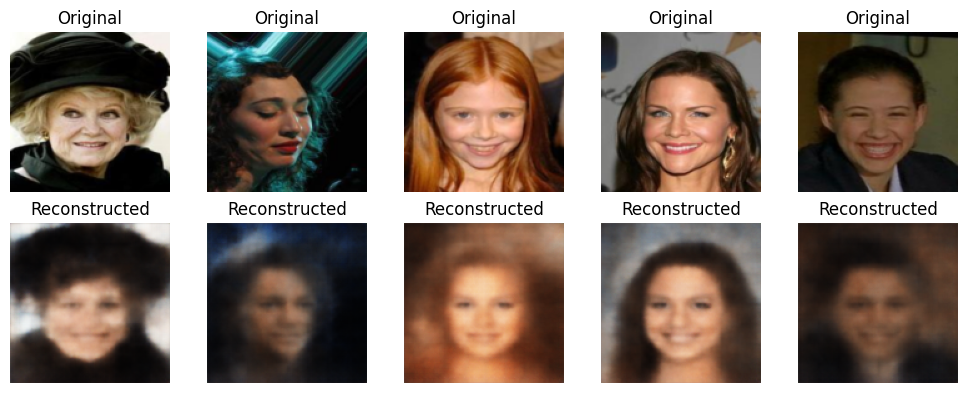

In [34]:
sample_images(model, val_loader, device)

In [35]:
model2 = BetaVAE( beta=5, img_size=128, latent_dim=32)
model2.to(device)
print(f"Variation Autoencoder with parameters {count_parameters(model2)}")
optimizer = torch.optim.AdamW(model2.parameters(), lr=5e-4)


train(model2, "vae5_log.csv", "vae5_model.pth", epochs=20)

Variation Autoencoder with parameters 3943587


VAE Epochs:   5%|▌         | 1/20 [00:08<02:41,  8.49s/it]

Epoch 1/20, Total Loss: 22.918685913085938, Reconstruction Loss: 20.441843032836914, KLD Loss: 2.4768433570861816


VAE Epochs:  10%|█         | 2/20 [00:17<02:36,  8.71s/it]

Epoch 2/20, Total Loss: 17.560739517211914, Reconstruction Loss: 14.679303169250488, KLD Loss: 2.8814353942871094


VAE Epochs:  15%|█▌        | 3/20 [00:26<02:27,  8.70s/it]

Epoch 3/20, Total Loss: 15.642416000366211, Reconstruction Loss: 12.678133010864258, KLD Loss: 2.9642834663391113


VAE Epochs:  20%|██        | 4/20 [00:34<02:18,  8.64s/it]

Epoch 4/20, Total Loss: 16.213523864746094, Reconstruction Loss: 12.928201675415039, KLD Loss: 3.285322427749634


VAE Epochs:  25%|██▌       | 5/20 [00:43<02:09,  8.64s/it]

Epoch 5/20, Total Loss: 13.844464302062988, Reconstruction Loss: 10.581666946411133, KLD Loss: 3.2627973556518555


VAE Epochs:  30%|███       | 6/20 [00:52<02:02,  8.77s/it]

Epoch 6/20, Total Loss: 15.220771789550781, Reconstruction Loss: 12.056694984436035, KLD Loss: 3.1640756130218506


VAE Epochs:  35%|███▌      | 7/20 [01:00<01:52,  8.68s/it]

Epoch 7/20, Total Loss: 13.641458511352539, Reconstruction Loss: 10.70987606048584, KLD Loss: 2.93158221244812


VAE Epochs:  40%|████      | 8/20 [01:09<01:43,  8.60s/it]

Epoch 8/20, Total Loss: 15.245445251464844, Reconstruction Loss: 12.067163467407227, KLD Loss: 3.178281784057617


VAE Epochs:  45%|████▌     | 9/20 [01:17<01:34,  8.59s/it]

Epoch 9/20, Total Loss: 12.954565048217773, Reconstruction Loss: 9.797530174255371, KLD Loss: 3.1570346355438232


VAE Epochs:  50%|█████     | 10/20 [01:26<01:27,  8.78s/it]

Epoch 10/20, Total Loss: 14.889755249023438, Reconstruction Loss: 11.857909202575684, KLD Loss: 3.031846046447754


VAE Epochs:  55%|█████▌    | 11/20 [01:35<01:18,  8.73s/it]

Epoch 11/20, Total Loss: 12.938841819763184, Reconstruction Loss: 9.957518577575684, KLD Loss: 2.9813232421875


VAE Epochs:  60%|██████    | 12/20 [01:44<01:09,  8.73s/it]

Epoch 12/20, Total Loss: 15.730615615844727, Reconstruction Loss: 12.614300727844238, KLD Loss: 3.1163153648376465


VAE Epochs:  65%|██████▌   | 13/20 [01:53<01:01,  8.78s/it]

Epoch 13/20, Total Loss: 13.901934623718262, Reconstruction Loss: 10.921842575073242, KLD Loss: 2.9800922870635986


VAE Epochs:  70%|███████   | 14/20 [02:01<00:52,  8.74s/it]

Epoch 14/20, Total Loss: 14.999323844909668, Reconstruction Loss: 12.030401229858398, KLD Loss: 2.9689218997955322


VAE Epochs:  75%|███████▌  | 15/20 [02:10<00:43,  8.73s/it]

Epoch 15/20, Total Loss: 13.187877655029297, Reconstruction Loss: 9.997753143310547, KLD Loss: 3.190124273300171


VAE Epochs:  80%|████████  | 16/20 [02:18<00:34,  8.64s/it]

Epoch 16/20, Total Loss: 13.637004852294922, Reconstruction Loss: 10.424015045166016, KLD Loss: 3.212989330291748


VAE Epochs:  85%|████████▌ | 17/20 [02:28<00:26,  8.82s/it]

Epoch 17/20, Total Loss: 13.096903800964355, Reconstruction Loss: 10.086803436279297, KLD Loss: 3.010101556777954


VAE Epochs:  90%|█████████ | 18/20 [02:36<00:17,  8.75s/it]

Epoch 18/20, Total Loss: 11.177985191345215, Reconstruction Loss: 8.171646118164062, KLD Loss: 3.006338357925415


VAE Epochs:  95%|█████████▌| 19/20 [02:45<00:08,  8.71s/it]

Epoch 19/20, Total Loss: 12.030472755432129, Reconstruction Loss: 8.91071891784668, KLD Loss: 3.119753122329712


VAE Epochs: 100%|██████████| 20/20 [02:53<00:00,  8.69s/it]

Epoch 20/20, Total Loss: 16.048603057861328, Reconstruction Loss: 12.668728828430176, KLD Loss: 3.3798739910125732
Model saved to vae5_model.pth.


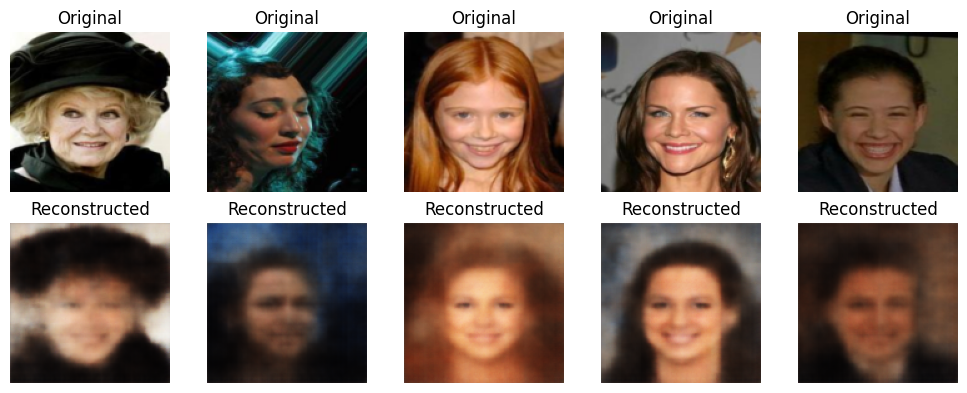

In [36]:
sample_images(model2, val_loader, device)

In [37]:
model4 = BetaVAE(beta=10, img_size=128, latent_dim=32)
model4.to(device)
print(f"Variation Autoencoder with parameters {count_parameters(model4)}")
optimizer = torch.optim.AdamW(model4.parameters(), lr=5e-4)

train(model4, "vae7_log.csv", "vae7_model.pth", epochs=20)

Variation Autoencoder with parameters 3943587


VAE Epochs:   5%|▌         | 1/20 [00:08<02:40,  8.45s/it]

Epoch 1/20, Total Loss: 21.945938110351562, Reconstruction Loss: 18.249982833862305, KLD Loss: 3.6959545612335205


VAE Epochs:  10%|█         | 2/20 [00:16<02:31,  8.42s/it]

Epoch 2/20, Total Loss: 18.725210189819336, Reconstruction Loss: 14.935297012329102, KLD Loss: 3.7899131774902344


VAE Epochs:  15%|█▌        | 3/20 [00:25<02:23,  8.42s/it]

Epoch 3/20, Total Loss: 22.166948318481445, Reconstruction Loss: 18.395002365112305, KLD Loss: 3.771946430206299


VAE Epochs:  20%|██        | 4/20 [00:34<02:19,  8.71s/it]

Epoch 4/20, Total Loss: 18.911415100097656, Reconstruction Loss: 14.449761390686035, KLD Loss: 4.461652755737305


VAE Epochs:  25%|██▌       | 5/20 [00:42<02:09,  8.65s/it]

Epoch 5/20, Total Loss: 17.50251579284668, Reconstruction Loss: 13.4888916015625, KLD Loss: 4.013623237609863


VAE Epochs:  30%|███       | 6/20 [00:51<02:00,  8.58s/it]

Epoch 6/20, Total Loss: 16.852922439575195, Reconstruction Loss: 12.901738166809082, KLD Loss: 3.9511852264404297


VAE Epochs:  35%|███▌      | 7/20 [00:59<01:50,  8.50s/it]

Epoch 7/20, Total Loss: 18.76871681213379, Reconstruction Loss: 14.153312683105469, KLD Loss: 4.615403175354004


VAE Epochs:  40%|████      | 8/20 [01:08<01:43,  8.61s/it]

Epoch 8/20, Total Loss: 15.679326057434082, Reconstruction Loss: 11.444679260253906, KLD Loss: 4.234647274017334


VAE Epochs:  45%|████▌     | 9/20 [01:17<01:34,  8.55s/it]

Epoch 9/20, Total Loss: 21.411212921142578, Reconstruction Loss: 16.872329711914062, KLD Loss: 4.538883209228516


VAE Epochs:  50%|█████     | 10/20 [01:25<01:25,  8.51s/it]

Epoch 10/20, Total Loss: 15.826709747314453, Reconstruction Loss: 11.667946815490723, KLD Loss: 4.158763408660889


VAE Epochs:  55%|█████▌    | 11/20 [01:34<01:17,  8.56s/it]

Epoch 11/20, Total Loss: 14.86962890625, Reconstruction Loss: 10.780350685119629, KLD Loss: 4.089278697967529


VAE Epochs:  60%|██████    | 12/20 [01:43<01:09,  8.67s/it]

Epoch 12/20, Total Loss: 16.530715942382812, Reconstruction Loss: 11.546854019165039, KLD Loss: 4.983861923217773


VAE Epochs:  65%|██████▌   | 13/20 [01:51<01:00,  8.58s/it]

Epoch 13/20, Total Loss: 14.648589134216309, Reconstruction Loss: 10.560718536376953, KLD Loss: 4.087871551513672


VAE Epochs:  70%|███████   | 14/20 [01:59<00:51,  8.54s/it]

Epoch 14/20, Total Loss: 16.8695125579834, Reconstruction Loss: 12.488492012023926, KLD Loss: 4.381019592285156


VAE Epochs:  75%|███████▌  | 15/20 [02:08<00:42,  8.60s/it]

Epoch 15/20, Total Loss: 14.366609573364258, Reconstruction Loss: 9.972206115722656, KLD Loss: 4.39440393447876


VAE Epochs:  80%|████████  | 16/20 [02:17<00:34,  8.60s/it]

Epoch 16/20, Total Loss: 16.77802276611328, Reconstruction Loss: 12.242218017578125, KLD Loss: 4.535804748535156


VAE Epochs:  85%|████████▌ | 17/20 [02:25<00:25,  8.58s/it]

Epoch 17/20, Total Loss: 17.31650161743164, Reconstruction Loss: 12.477946281433105, KLD Loss: 4.83855676651001


VAE Epochs:  90%|█████████ | 18/20 [02:34<00:17,  8.62s/it]

Epoch 18/20, Total Loss: 15.224862098693848, Reconstruction Loss: 10.933613777160645, KLD Loss: 4.291248321533203


VAE Epochs:  95%|█████████▌| 19/20 [02:43<00:08,  8.74s/it]

Epoch 19/20, Total Loss: 14.12140941619873, Reconstruction Loss: 9.956277847290039, KLD Loss: 4.16513204574585


VAE Epochs: 100%|██████████| 20/20 [02:51<00:00,  8.59s/it]

Epoch 20/20, Total Loss: 18.07567596435547, Reconstruction Loss: 14.223114013671875, KLD Loss: 3.8525619506835938
Model saved to vae7_model.pth.


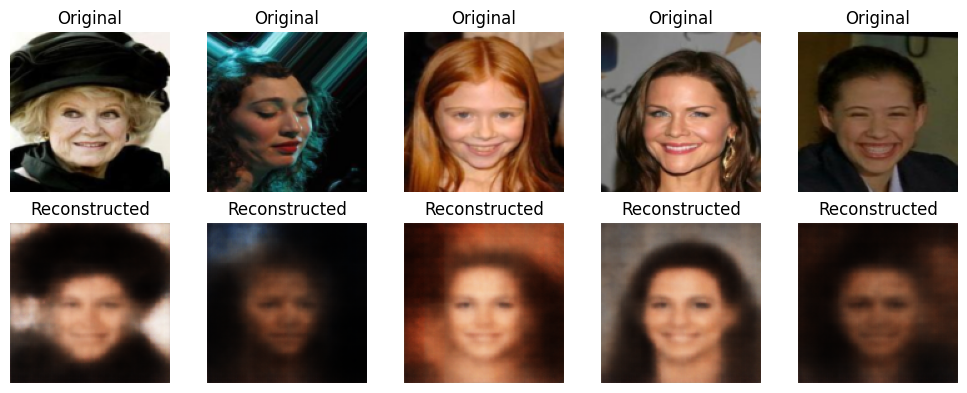

In [38]:
sample_images(model4, val_loader, device)

In [39]:
model3 = BetaVAE(beta=15, img_size=128, latent_dim=32)
model3.to(device)
print(f"Variation Autoencoder with parameters {count_parameters(model3)}")
optimizer = torch.optim.AdamW(model3.parameters(), lr=5e-4)


train(model3, "vae10_log.csv", "vae10_model.pth", epochs=20)

Variation Autoencoder with parameters 3943587


VAE Epochs:   5%|▌         | 1/20 [00:09<02:58,  9.40s/it]

Epoch 1/20, Total Loss: 23.720611572265625, Reconstruction Loss: 18.911548614501953, KLD Loss: 4.809062957763672


VAE Epochs:  10%|█         | 2/20 [00:18<02:41,  8.97s/it]

Epoch 2/20, Total Loss: 19.292144775390625, Reconstruction Loss: 15.472311973571777, KLD Loss: 3.819831371307373


VAE Epochs:  15%|█▌        | 3/20 [00:26<02:29,  8.79s/it]

Epoch 3/20, Total Loss: 24.138765335083008, Reconstruction Loss: 19.575197219848633, KLD Loss: 4.563567161560059


VAE Epochs:  20%|██        | 4/20 [00:35<02:19,  8.72s/it]

Epoch 4/20, Total Loss: 18.303241729736328, Reconstruction Loss: 13.581571578979492, KLD Loss: 4.721671104431152


VAE Epochs:  25%|██▌       | 5/20 [00:44<02:10,  8.73s/it]

Epoch 5/20, Total Loss: 16.969730377197266, Reconstruction Loss: 12.44594955444336, KLD Loss: 4.523780822753906


VAE Epochs:  30%|███       | 6/20 [00:52<02:03,  8.81s/it]

Epoch 6/20, Total Loss: 21.43477439880371, Reconstruction Loss: 15.900728225708008, KLD Loss: 5.5340471267700195


VAE Epochs:  35%|███▌      | 7/20 [01:01<01:52,  8.67s/it]

Epoch 7/20, Total Loss: 18.531414031982422, Reconstruction Loss: 13.522086143493652, KLD Loss: 5.009328842163086


VAE Epochs:  40%|████      | 8/20 [01:09<01:43,  8.62s/it]

Epoch 8/20, Total Loss: 18.28797149658203, Reconstruction Loss: 13.215535163879395, KLD Loss: 5.072436332702637


VAE Epochs:  45%|████▌     | 9/20 [01:18<01:34,  8.57s/it]

Epoch 9/20, Total Loss: 22.823017120361328, Reconstruction Loss: 16.927337646484375, KLD Loss: 5.895678997039795


VAE Epochs:  50%|█████     | 10/20 [01:27<01:27,  8.80s/it]

Epoch 10/20, Total Loss: 17.35199737548828, Reconstruction Loss: 12.766547203063965, KLD Loss: 4.585450172424316


VAE Epochs:  55%|█████▌    | 11/20 [01:36<01:19,  8.80s/it]

Epoch 11/20, Total Loss: 16.260452270507812, Reconstruction Loss: 11.453889846801758, KLD Loss: 4.8065619468688965


VAE Epochs:  60%|██████    | 12/20 [01:45<01:10,  8.79s/it]

Epoch 12/20, Total Loss: 17.60442352294922, Reconstruction Loss: 12.663838386535645, KLD Loss: 4.940584659576416


VAE Epochs:  65%|██████▌   | 13/20 [01:54<01:01,  8.80s/it]

Epoch 13/20, Total Loss: 16.689233779907227, Reconstruction Loss: 11.61194133758545, KLD Loss: 5.077293395996094


VAE Epochs:  70%|███████   | 14/20 [02:02<00:52,  8.76s/it]

Epoch 14/20, Total Loss: 18.548368453979492, Reconstruction Loss: 12.994978904724121, KLD Loss: 5.553390026092529


VAE Epochs:  75%|███████▌  | 15/20 [02:11<00:43,  8.67s/it]

Epoch 15/20, Total Loss: 17.403928756713867, Reconstruction Loss: 11.860543251037598, KLD Loss: 5.5433855056762695


VAE Epochs:  80%|████████  | 16/20 [02:19<00:34,  8.62s/it]

Epoch 16/20, Total Loss: 16.207550048828125, Reconstruction Loss: 11.464851379394531, KLD Loss: 4.742698669433594


VAE Epochs:  85%|████████▌ | 17/20 [02:28<00:26,  8.73s/it]

Epoch 17/20, Total Loss: 18.99886703491211, Reconstruction Loss: 14.513063430786133, KLD Loss: 4.485804080963135


VAE Epochs:  90%|█████████ | 18/20 [02:37<00:17,  8.65s/it]

Epoch 18/20, Total Loss: 16.626811981201172, Reconstruction Loss: 12.338678359985352, KLD Loss: 4.2881340980529785


VAE Epochs:  95%|█████████▌| 19/20 [02:45<00:08,  8.63s/it]

Epoch 19/20, Total Loss: 18.401290893554688, Reconstruction Loss: 12.841300964355469, KLD Loss: 5.559988498687744


VAE Epochs: 100%|██████████| 20/20 [02:54<00:00,  8.71s/it]

Epoch 20/20, Total Loss: 19.257741928100586, Reconstruction Loss: 13.018584251403809, KLD Loss: 6.239156723022461
Model saved to vae10_model.pth.


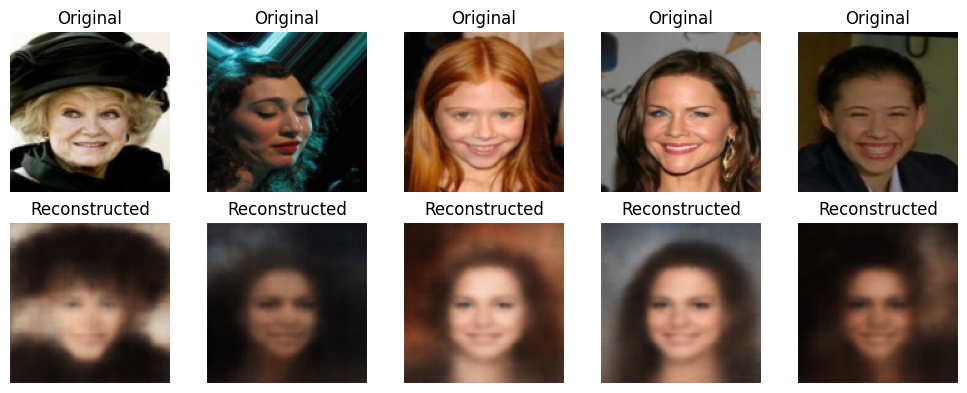

In [40]:
sample_images(model3, val_loader, device)

In [46]:
import torch
import matplotlib.pyplot as plt

def compare_original_and_reconstructed(model, data_loader, num_images=5):
    model.eval()
    original_images = []
    reconstructed_images = []

    for i, (images, _) in enumerate(data_loader):
        if i >= num_images:
            break
        images = images.to(device)
        
        with torch.no_grad():
            output = model(images)
            if isinstance(output, tuple) or isinstance(output, list):
                reconstructions = output[0] 
            else:
                reconstructions = output

        if isinstance(reconstructions, list):
            reconstructions = torch.stack(reconstructions)

        original_images.append(images.cpu())
        reconstructed_images.append(reconstructions.cpu())

    fig, axes = plt.subplots(num_images, 2, figsize=(10, 5 * num_images))
    for i in range(num_images):
        orig_img = original_images[i][0].permute(1, 2, 0).numpy()
        recon_img = reconstructed_images[i][0].permute(1, 2, 0).numpy()

        axes[i, 0].imshow(orig_img)
        axes[i, 0].set_title("Original Image")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(recon_img)
        axes[i, 1].set_title("Reconstructed Image")
        axes[i, 1].axis("off")

    plt.tight_layout()
    plt.show()


Enhanced Latent Space Traversal:


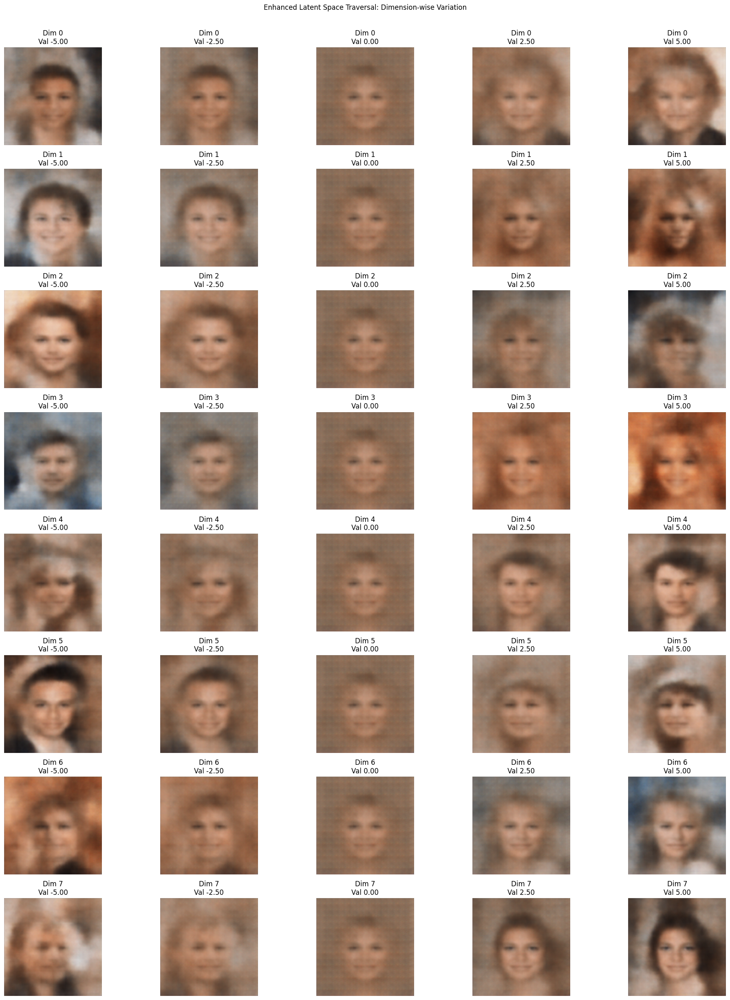


Latent Space Interpolation:


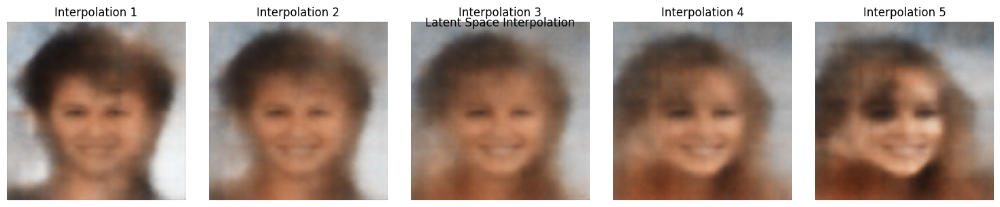

In [48]:
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

def enhanced_latent_traversal(model, num_dims=8, num_samples=10):
    
    model.eval()
    fig, axes = plt.subplots(num_dims, num_samples, figsize=(20, 3*num_dims))
    
    for dim in range(min(num_dims, model.latent_dim)):
        z_base = torch.zeros(1, model.latent_dim).to(device)
        variations = np.linspace(-5, 5, num_samples)
        
        for i, variation in enumerate(variations):
            z = z_base.clone()
            z[0, dim] = variation
            
            with torch.no_grad():
                sample = model.decode(z)
                sample = sample.cpu().squeeze()
            
            ax = axes[dim, i]
            img = sample.permute(1, 2, 0).numpy()  
            ax.imshow(img)
            ax.axis('off')
            ax.set_title(f'Dim {dim}\nVal {variation:.2f}')
    
    plt.tight_layout()
    plt.suptitle('Enhanced Latent Space Traversal: Dimension-wise Variation', y=1.02)
    plt.show()
    

def interpolation_traversal(model, num_interpolations=5):

    model.eval()
    z_start = torch.randn(1, model.latent_dim).to(device)
    z_end = torch.randn(1, model.latent_dim).to(device)
    plt.figure(figsize=(15, 3))
    
    for i in range(num_interpolations):
        alpha = i / (num_interpolations - 1)
        z_interpolated = (1 - alpha) * z_start + alpha * z_end
        
        with torch.no_grad():
            sample = model.decode(z_interpolated)
            sample = sample.cpu().squeeze()
        
        plt.subplot(1, num_interpolations, i+1)
        img = sample.permute(1, 2, 0).numpy()  
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Interpolation {i+1}')
    
    plt.tight_layout()
    plt.suptitle('Latent Space Interpolation', y=0.95)
    plt.show()

print("Enhanced Latent Space Traversal:")
enhanced_latent_traversal(model, num_dims=8, num_samples=5)

print("\nLatent Space Interpolation:")
interpolation_traversal(model, num_interpolations=5)

Enhanced Latent Space Traversal:


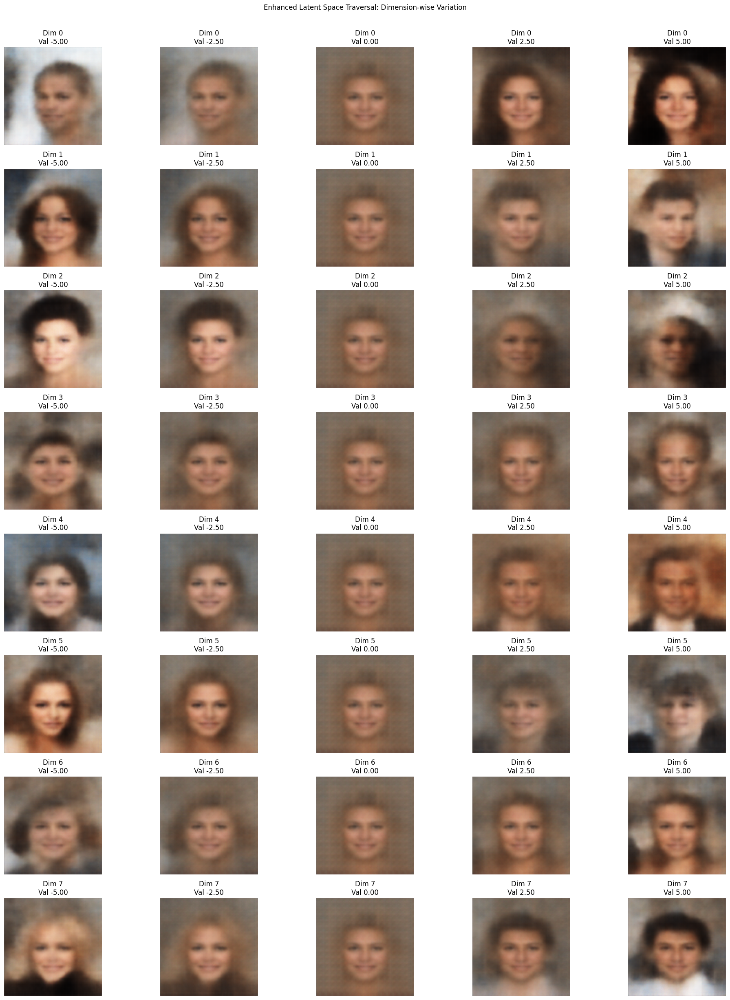


Latent Space Interpolation:


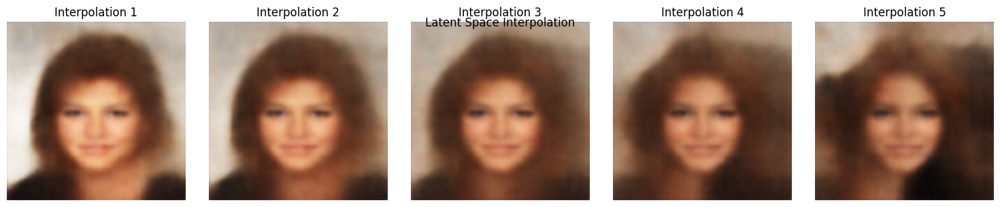

In [50]:
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

def enhanced_latent_traversal(model2, num_dims=8, num_samples=10):

    model2.eval()
    fig, axes = plt.subplots(num_dims, num_samples, figsize=(20, 3*num_dims))
    
    for dim in range(min(num_dims, model2.latent_dim)):
        z_base = torch.zeros(1, model2.latent_dim).to(device)
        variations = np.linspace(-5, 5, num_samples)
        
        for i, variation in enumerate(variations):
            z = z_base.clone()
            z[0, dim] = variation
            
            with torch.no_grad():
                sample = model2.decode(z)
                sample = sample.cpu().squeeze()
            
            ax = axes[dim, i]
            img = sample.permute(1, 2, 0).numpy() 
            ax.imshow(img)
            ax.axis('off')
            ax.set_title(f'Dim {dim}\nVal {variation:.2f}')
    
    plt.tight_layout()
    plt.suptitle('Enhanced Latent Space Traversal: Dimension-wise Variation', y=1.02)
    plt.show()

def interpolation_traversal(model2, num_interpolations=5):

    model2.eval()
    z_start = torch.randn(1, model2.latent_dim).to(device)
    z_end = torch.randn(1, model2.latent_dim).to(device)
    plt.figure(figsize=(15, 3))
    
    for i in range(num_interpolations):
        alpha = i / (num_interpolations - 1)
        z_interpolated = (1 - alpha) * z_start + alpha * z_end
        with torch.no_grad():
            sample = model2.decode(z_interpolated)
            sample = sample.cpu().squeeze()
        
        plt.subplot(1, num_interpolations, i+1)
        img = sample.permute(1, 2, 0).numpy() 
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Interpolation {i+1}')
    
    plt.tight_layout()
    plt.suptitle('Latent Space Interpolation', y=0.95)
    plt.show()

print("Enhanced Latent Space Traversal:")
enhanced_latent_traversal(model2, num_dims=8, num_samples=5)

print("\nLatent Space Interpolation:")
interpolation_traversal(model2, num_interpolations=5)

Enhanced Latent Space Traversal:


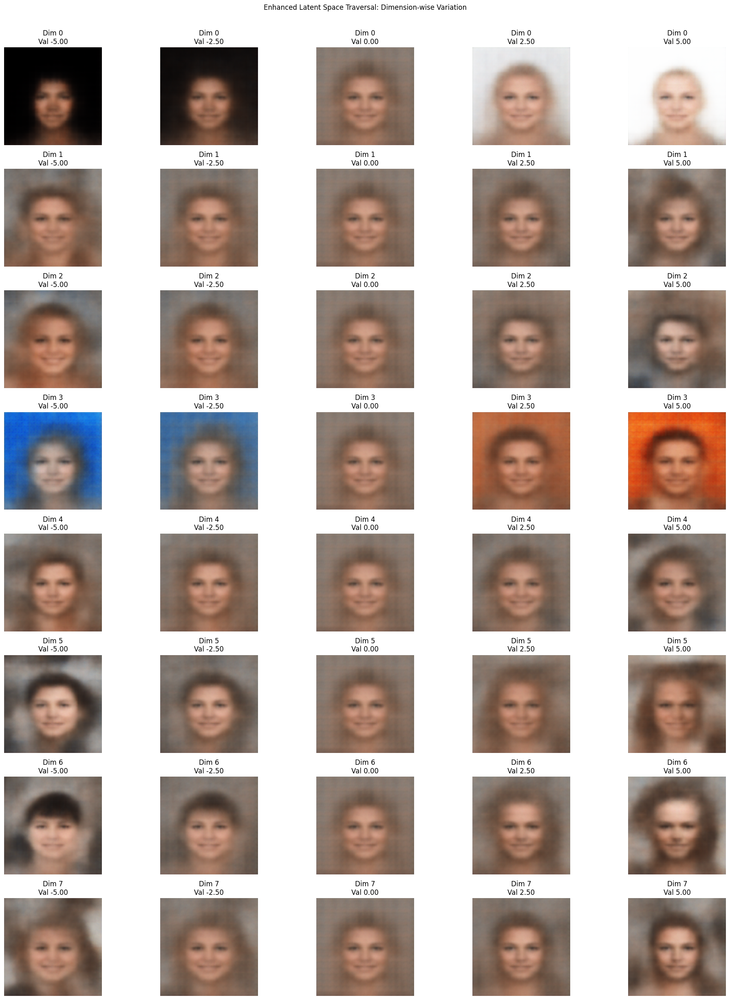


Latent Space Interpolation:


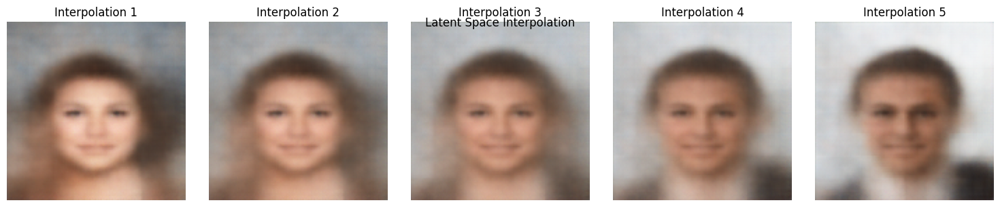

In [49]:
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

def enhanced_latent_traversal(model3, num_dims=8, num_samples=10):
    
    model3.eval()
    fig, axes = plt.subplots(num_dims, num_samples, figsize=(20, 3*num_dims))

    for dim in range(min(num_dims, model3.latent_dim)):
        z_base = torch.zeros(1, model3.latent_dim).to(device)
        variations = np.linspace(-5, 5, num_samples)
        
        for i, variation in enumerate(variations):
            z = z_base.clone()
            z[0, dim] = variation
            with torch.no_grad():
                sample = model3.decode(z)
                sample = sample.cpu().squeeze()
            
            # Plot the sample
            ax = axes[dim, i]
            img = sample.permute(1, 2, 0).numpy()  
            ax.imshow(img)
            ax.axis('off')
            ax.set_title(f'Dim {dim}\nVal {variation:.2f}')
    
    plt.tight_layout()
    plt.suptitle('Enhanced Latent Space Traversal: Dimension-wise Variation', y=1.02)
    plt.show()

def interpolation_traversal(model3, num_interpolations=5):
    
    model3.eval()
    z_start = torch.randn(1, model3.latent_dim).to(device)
    z_end = torch.randn(1, model3.latent_dim).to(device)
    plt.figure(figsize=(15, 3))
    
    for i in range(num_interpolations):
        alpha = i / (num_interpolations - 1)
        z_interpolated = (1 - alpha) * z_start + alpha * z_end
        
        with torch.no_grad():
            sample = model3.decode(z_interpolated)
            sample = sample.cpu().squeeze()
        
        plt.subplot(1, num_interpolations, i+1)
        img = sample.permute(1, 2, 0).numpy() 
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Interpolation {i+1}')
    
    plt.tight_layout()
    plt.suptitle('Latent Space Interpolation', y=0.95)
    plt.show()

print("Enhanced Latent Space Traversal:")
enhanced_latent_traversal(model3, num_dims=8, num_samples=5)

print("\nLatent Space Interpolation:")
interpolation_traversal(model3, num_interpolations=5)

Enhanced Latent Space Traversal:


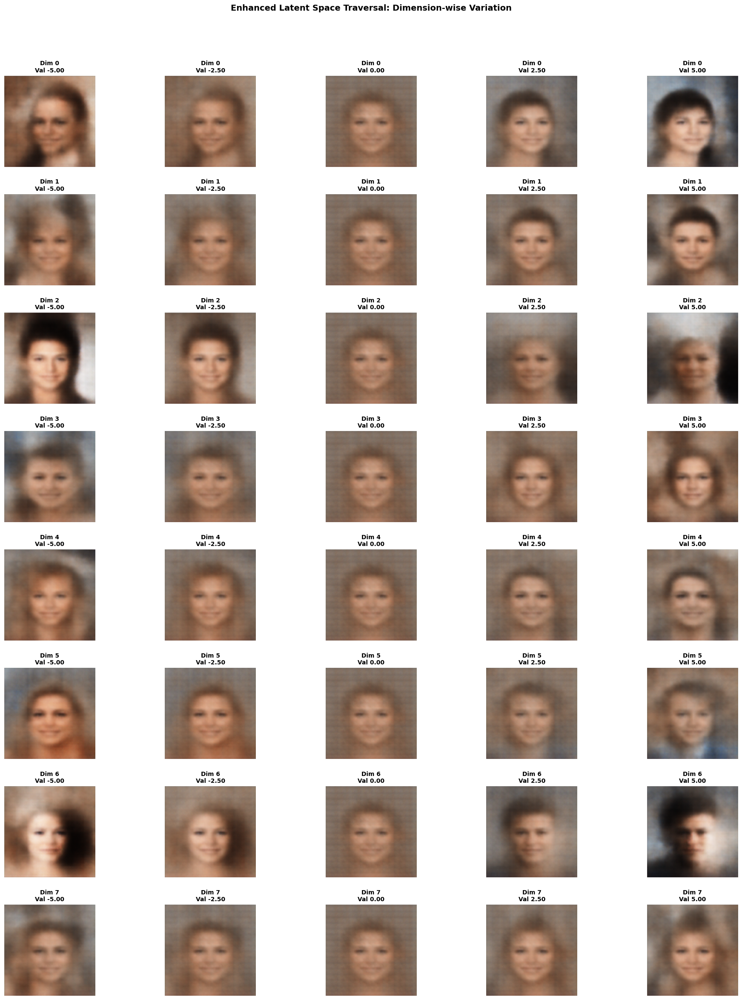


Latent Space Interpolation:


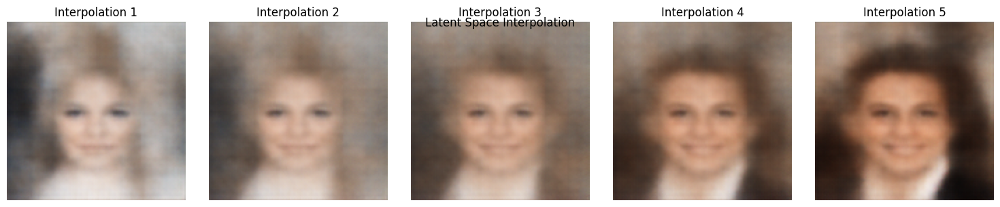

In [52]:
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

def enhanced_latent_traversal(model4, num_dims=8, num_samples=10):
    
    model4.eval()
    fig, axes = plt.subplots(num_dims, num_samples, figsize=(20, 3*num_dims))
    
    for dim in range(min(num_dims, model4.latent_dim)):
        z_base = torch.zeros(1, model4.latent_dim).to(device)
        variations = np.linspace(-5, 5, num_samples)
        
        for i, variation in enumerate(variations):
            z = z_base.clone()
            z[0, dim] = variation
            
            with torch.no_grad():
                sample = model4.decode(z)
                sample = sample.cpu().squeeze()
            
            ax = axes[dim, i]
            img = sample.permute(1, 2, 0).numpy()  
            ax.imshow(img)
            ax.axis('off')
            ax.set_title(f'Dim {dim}\nVal {variation:.2f}')
    
    plt.tight_layout()
    plt.suptitle('Enhanced Latent Space Traversal: Dimension-wise Variation', y=1.02)
    plt.show()

def interpolation_traversal(model4, num_interpolations=5):
  
    model4.eval()
    z_start = torch.randn(1, model4.latent_dim).to(device)
    z_end = torch.randn(1, model4.latent_dim).to(device)
    plt.figure(figsize=(15, 3))
    
    for i in range(num_interpolations):
        alpha = i / (num_interpolations - 1)
        z_interpolated = (1 - alpha) * z_start + alpha * z_end
        with torch.no_grad():
            sample = model4.decode(z_interpolated)
            sample = sample.cpu().squeeze()
        
        plt.subplot(1, num_interpolations, i+1)
        img = sample.permute(1, 2, 0).numpy() 
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Interpolation {i+1}')
    
    plt.tight_layout()
    plt.suptitle('Latent Space Interpolation', y=0.95)
    plt.show()

print("Enhanced Latent Space Traversal:")
enhanced_latent_traversal(model4, num_dims=8, num_samples=5)
print("\nLatent Space Interpolation:")
interpolation_traversal(model4, num_interpolations=5)


Evaluating model with β=1
Z-Diff score for β=1: 0.1349
Evaluating model with β=5
Z-Diff score for β=5: 0.3761
Evaluating model with β=10
Z-Diff score for β=10: 0.5298
Evaluating model with β=15
Z-Diff score for β=15: 0.455


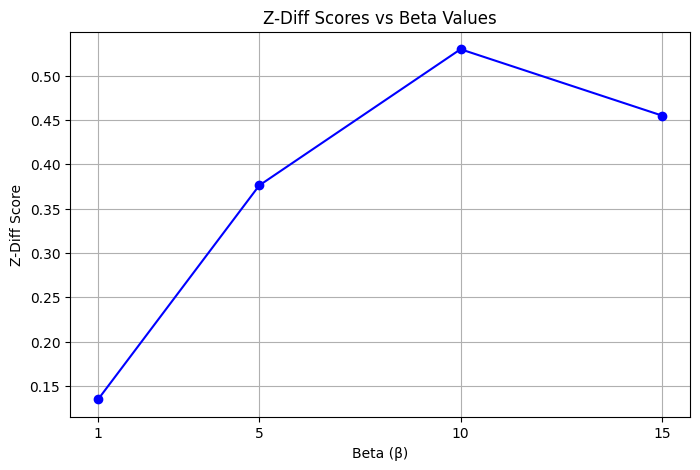

In [2]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import pairwise_distances

def z_diff_metric(latent_representations):
    distances = pairwise_distances(latent_representations, metric='euclidean')
    z_diff = np.var(distances)
    return z_diff

def evaluate_model(model, data_loader, device):
    model.eval()
    all_latents = []

    with torch.no_grad():
        for images, _ in data_loader:
            images = images.to(device)
            mu, log_var = model.encode(images)
            latents = mu.cpu().numpy()
            all_latents.append(latents)

    all_latents = np.vstack(all_latents)
    z_diff_score = z_diff_metric(all_latents)
    return z_diff_score

models = [model, model2, model3, model4] 
beta_values = [1, 5, 10, 15]  
device = "cuda" if torch.cuda.is_available() else "cpu"
z_diff_scores = []

for model, beta in zip(models, beta_values):
    print(f"Evaluating model with β={beta}")
    model.to(device)
    z_diff_score = evaluate_model(model, val_loader, device)
    print(f"Z-Diff score for β={beta}: {z_diff_score}")
    z_diff_scores.append(z_diff_score)

plt.figure(figsize=(8, 6))
plt.plot(beta_values, z_diff_scores, marker='o', linestyle='-', color='b')
plt.title("Z-Diff Scores for Different β-VAE Models")
plt.xlabel("β Value")
plt.ylabel("Z-Diff Score")
plt.xticks(beta_values) 
plt.grid(True)
plt.show()